In [1]:
# !pip install -qq diffusers transformers ftfy accelerate


In [2]:
import os
import torch
import math
from PIL import Image

In [3]:
import importlib
def reload_module(module_name):
  module = importlib.import_module(module_name)
  importlib.reload(module)

In [4]:
import assignment24Helper as ah
reload_module("assignment24Helper")

In [5]:
torch_device = "cuda" if torch.cuda.is_available() else "cpu"
# "runwayml/stable-diffusion-v1-5"
PRE_TRAINED_MODEL = "CompVis/stable-diffusion-v1-4"
print(torch_device)

cuda


In [6]:
torch.manual_seed(ah.Config.SEED)
generator = torch.Generator(device="cuda").manual_seed(ah.Config.SEED)

In [7]:
def image_grid(imgs, rows=1, cols=None):
    if cols is None: cols = math.ceil(len(imgs)/rows)
    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    for i, img in enumerate(imgs): grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

In [8]:
concept_libraries = [

    "sd-concepts-library/glow-forest",
    "sd-concepts-library/birb-style",
    "sd-concepts-library/line-art",
    "sd-concepts-library/poolrooms",
    "sd-concepts-library/midjourney-style",
    "sd-concepts-library/depthmap"
]
    # "sd-concepts-library/birb-style"
    # "sd-concepts-library/line-art",
    # "sd-concepts-library/poolrooms",
    # "sd-concepts-library/midjourney-style",
    # "sd-concepts-library/depthmap"

    # "sd-concepts-library/glow-forest",    
    # "sd-concepts-library/3d-female-cyborgs",
    # "sd-concepts-library/style-of-marc-allante",
    # "sd-concepts-library/3d-female-cyborgs",
    # "sd-concepts-library/malika-favre-art-style",
    # "sd-concepts-library/dan-mumford"    


In [9]:
prompt = "A cinematic hand made wall poster of girl with umbrella and red flower"
num_samples = 2 #@param {type:"number"}
num_rows = 1 #@param {type:"number"}

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

c:\Users\1430647\Anaconda3\envs\cuda\lib\site-packages\transformers\tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a loo

  0%|          | 0/50 [00:00<?, ?it/s]

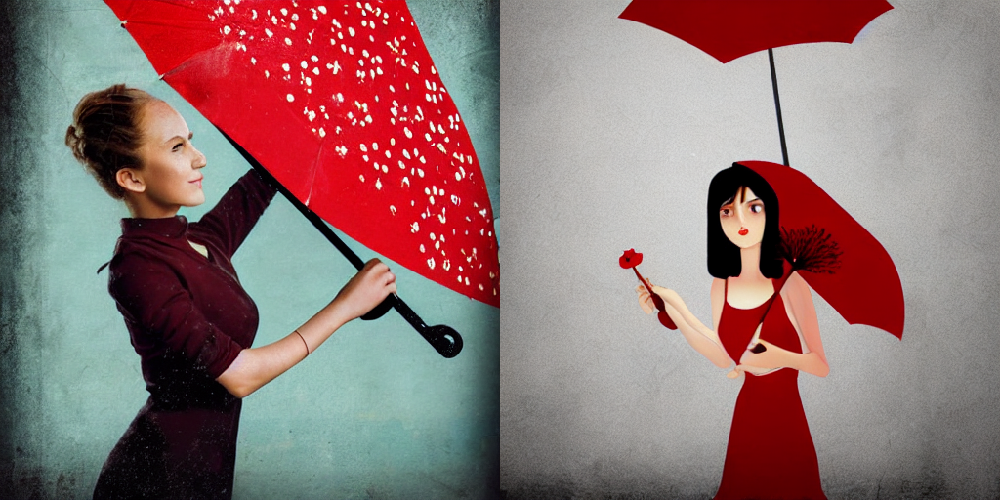

In [10]:
all_images = [] 
pipe = ah.get_stable_diffusion_pipeline(PRE_TRAINED_MODEL, torch_device=torch_device)

for _ in range(num_rows):
    images = pipe(prompt,
                  num_images_per_prompt=num_samples,
                  num_inference_steps=ah.Config.INFERENCE_STEPS,
                  guidance_scale=ah.Config.GUIDANCE_SCALE,
                  generator=generator).images
    all_images.extend(images)

grid = image_grid(all_images, rows=1)
grid

In [11]:
prompt_template = "A cinematic hand made wall poster of girl with umbrella and red <TBD>"

In [12]:
all_images = [] 
i = 1
pipe = ah.get_stable_diffusion_pipeline(PRE_TRAINED_MODEL, torch_device=torch_device)
for library in concept_libraries:
    generator = torch.Generator(device="cuda").manual_seed(ah.Config.SEED * i)
    i = i + 1
    
    # pipe.load_textual_inversion("sd-concepts-library/cat-toy")
    replacement_prompt_word = library.split("/")[1]
    prompt = prompt_template.replace("TBD", replacement_prompt_word)
    pipe.load_textual_inversion(library)
    print(prompt)
    for _ in range(num_rows):
        images = pipe(prompt, num_images_per_prompt=num_samples,
                        num_inference_steps=ah.Config.INFERENCE_STEPS,
                        guidance_scale=ah.Config.GUIDANCE_SCALE,
                        generator=generator).images
        all_images.extend(images)

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


A cinematic hand made wall poster of girl with umbrella and red <glow-forest>


  0%|          | 0/50 [00:00<?, ?it/s]

A cinematic hand made wall poster of girl with umbrella and red <birb-style>


  0%|          | 0/50 [00:00<?, ?it/s]

A cinematic hand made wall poster of girl with umbrella and red <line-art>


  0%|          | 0/50 [00:00<?, ?it/s]

A cinematic hand made wall poster of girl with umbrella and red <poolrooms>


  0%|          | 0/50 [00:00<?, ?it/s]

A cinematic hand made wall poster of girl with umbrella and red <midjourney-style>


  0%|          | 0/50 [00:00<?, ?it/s]

A cinematic hand made wall poster of girl with umbrella and red <depthmap>


  0%|          | 0/50 [00:00<?, ?it/s]

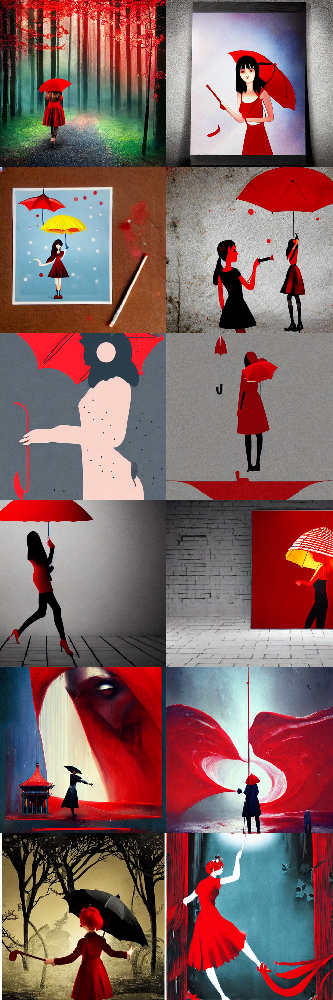

In [13]:
grid = image_grid(all_images, rows=len(concept_libraries))
grid

In [14]:
# from PIL import Image
# import numpy as np
# import matplotlib.pyplot as plt
# image_arrays = [np.array(img) for img in all_images]
# fig, axes = plt.subplots(nrows=10, figsize=(20, 100))
# for ax, img in zip(axes, image_arrays):
#     ax.imshow(img)
#     ax.axis('off')
# plt.show()

# Diffusion based on downloaded embeddings

In [15]:
from tqdm.auto import tqdm

In [16]:
import assignment24Helper as ah
reload_module("assignment24Helper")

In [17]:
KEYWORD = "flower" ## Flower token = 4055
prompt = "A cinematic hand made wall poster of girl with umbrella and red " + KEYWORD

def get_models_and_required_embeddings():
    models, selected_token, token_emb_layer, position_embeddings = ah.initialize_model(PRE_TRAINED_MODEL, torch_device=torch_device)    
    input_ids, token_embeddings = ah.get_token_embedding_for_prompt(models=models,
                                  token_emb_layer=token_emb_layer,
                                  prompt=prompt)
    
    return models, selected_token, token_emb_layer, position_embeddings, input_ids, token_embeddings

In [18]:

embedding_directory = "embeddings"
all_images = []
for apply_custom_loss_guidance in [False, True]:
  i = 1
  for concept_library in concept_libraries:
      print(f"Executing for library : {concept_library}")
      seed = ah.Config.SEED * i
      i = i + 1

      models, selected_token, token_emb_layer, position_embeddings, input_ids, token_embeddings = get_models_and_required_embeddings()
      replacement_token_embedding = ah.get_embedding_for_concept_library(concept_library, torch_device)
      token_embeddings[0, torch.where(input_ids[0]==selected_token)] = replacement_token_embedding.to(torch_device)

      # Combine with pos embs
      input_embeddings = token_embeddings + position_embeddings

      generated_image = ah.execute_diffusion_for_concept_library(models=models,
                                              input_embeddings=input_embeddings,
                                              text_input_max_length=input_ids.shape[-1],
                                                seed = seed,
                                                apply_custom_loss_guidance = apply_custom_loss_guidance)
      
      all_images.append(generated_image)
      
    


Executing for library : sd-concepts-library/glow-forest


c:\Users\1430647\My\repo\github\assignment-24-stable-diffusion\assignment24Helper.py:191: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  latents = torch.randn((batch_size, models.unet.in_channels, height // 8, width // 8), generator=generator)


  0%|          | 0/50 [00:00<?, ?it/s]

Executing for library : sd-concepts-library/birb-style


  0%|          | 0/50 [00:00<?, ?it/s]

Executing for library : sd-concepts-library/line-art


  0%|          | 0/50 [00:00<?, ?it/s]

Executing for library : sd-concepts-library/poolrooms


  0%|          | 0/50 [00:00<?, ?it/s]

Executing for library : sd-concepts-library/midjourney-style


  0%|          | 0/50 [00:00<?, ?it/s]

Executing for library : sd-concepts-library/depthmap


  0%|          | 0/50 [00:00<?, ?it/s]

Executing for library : sd-concepts-library/glow-forest


  0%|          | 0/50 [00:00<?, ?it/s]

It looks like you are trying to rescale already rescaled images. If the input images have pixel values between 0 and 1, set `do_rescale=False` to avoid rescaling them again.


Executing for library : sd-concepts-library/birb-style


  0%|          | 0/50 [00:00<?, ?it/s]

Executing for library : sd-concepts-library/line-art


  0%|          | 0/50 [00:00<?, ?it/s]

Executing for library : sd-concepts-library/poolrooms


  0%|          | 0/50 [00:00<?, ?it/s]

Executing for library : sd-concepts-library/midjourney-style


  0%|          | 0/50 [00:00<?, ?it/s]

Executing for library : sd-concepts-library/depthmap


  0%|          | 0/50 [00:00<?, ?it/s]

In [21]:
print(f"Total images count: {len(all_images)}")
grid = image_grid(all_images,  rows=len(concept_libraries))

Total images count: 12


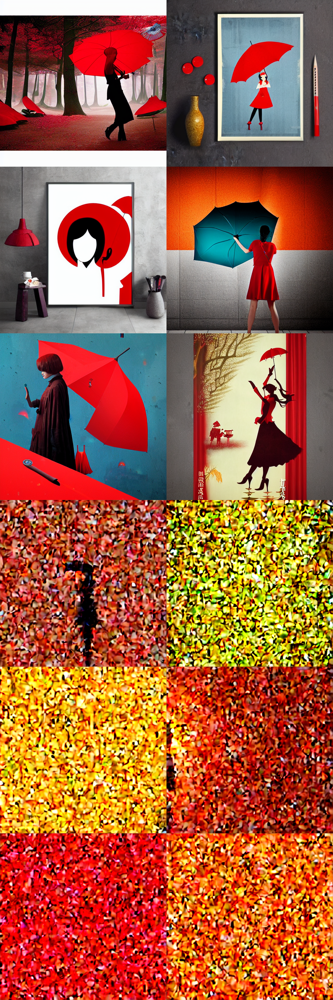

In [22]:
grid